# Audio Classification Using Deep learning
## mini project

In [1]:
# Load imports

import IPython.display as ipd
import librosa
import librosa.display
import matplotlib.pyplot as plt
import pandas as pd
import os

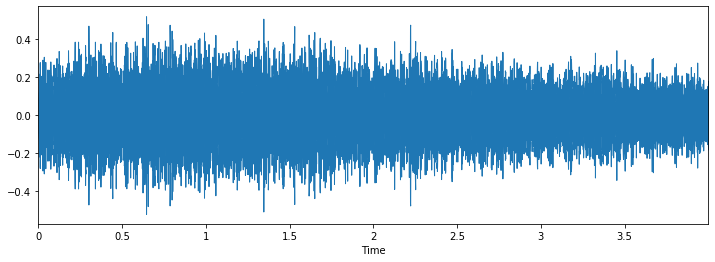

In [2]:
# Class: siren

filename = '../dataset/Train/0.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

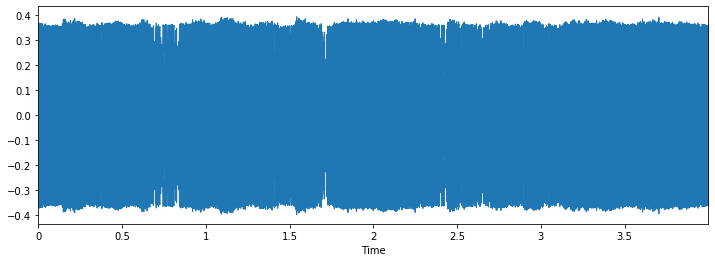

In [3]:
# Class: Street Music

filename = '../dataset/Train/1.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

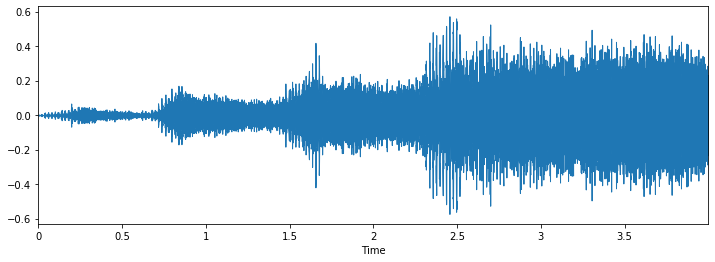

In [4]:
# Class: Drilling

filename = '../dataset/Train/2.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

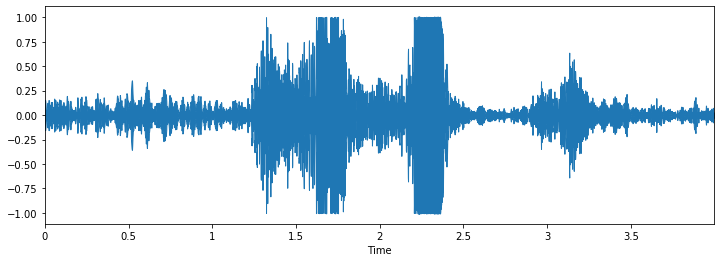

In [5]:
# Class: dog bark

filename = '../dataset/Train/4.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

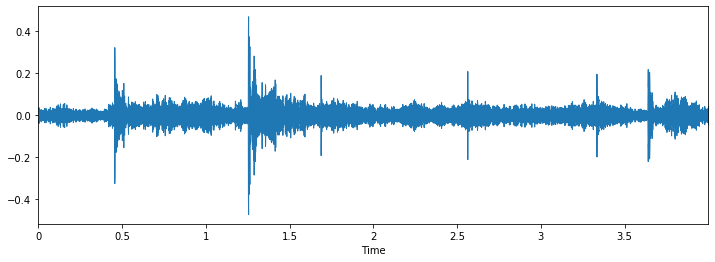

In [6]:
# Class: Children Playing

filename = '../dataset/Train/6.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

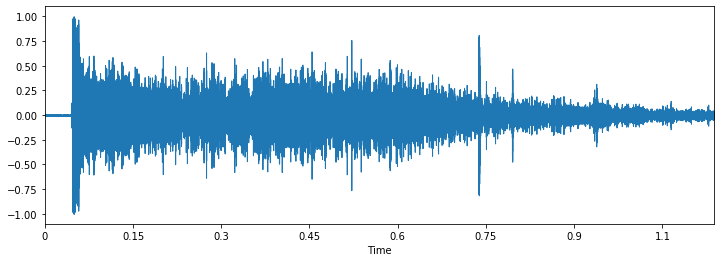

In [7]:
# Class: Gun Shot

filename = '../dataset/Train/12.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

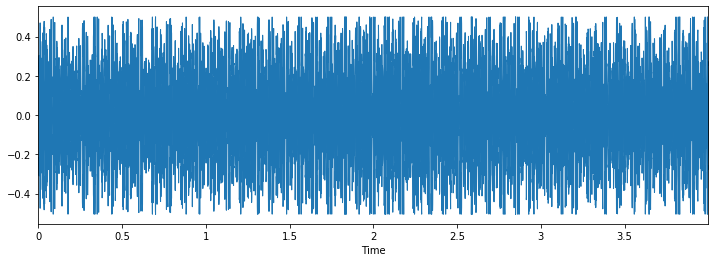

In [8]:
# Class: Engine Idling

filename = '../dataset/Train/17.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

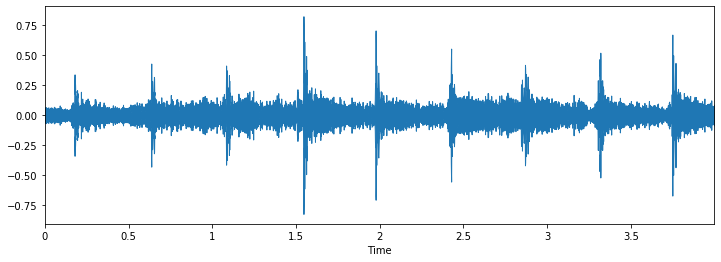

In [9]:
# Class: Air Conditioner

filename = '../dataset/Train/22.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

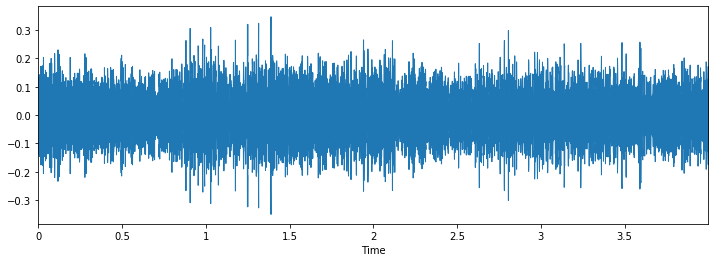

In [10]:
# Class: Jackhammer

filename = '../dataset/Train/33.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

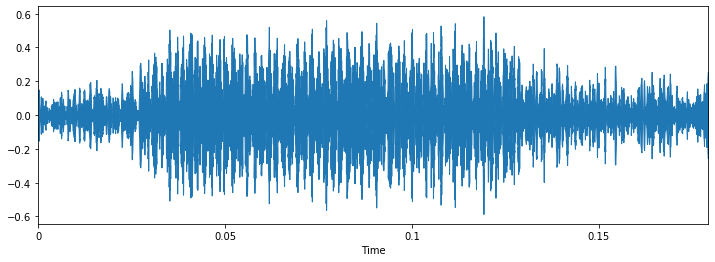

In [11]:
# Class: Car Horn

filename = '../dataset/Train/48.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

## This is how dataset looks

In [12]:
import pandas as pd
metadata = pd.read_csv('../dataset/labels/train.csv')
metadata.head()

,ID,Class
0,0.wav,siren
1,1.wav,street_music
2,2.wav,drilling
3,3.wav,siren
4,4.wav,dog_bark


### Class distributions

In [13]:
print(metadata.Class.value_counts())

jackhammer          668
engine_idling       624
siren               607
air_conditioner     600
dog_bark            600
drilling            600
street_music        600
children_playing    600
car_horn            306
gun_shot            230
Name: Class, dtype: int64


### Audio sample file properties

Next we will iterate through each of the audio sample files and extract, number of audio channels, sample rate and bit-depth. 

In [14]:
# Load various imports 
import pandas as pd
import os
import librosa
import librosa.display

from helpers.wavfilehelper import WavFileHelper
wavfilehelper = WavFileHelper()

audiodata = []
for index, row in metadata.iterrows():
    
    file_name = os.path.join(os.path.abspath('C:/Users/faiza/Desktop/audio/dataset/Train/'),str(row["ID"]))
    data = wavfilehelper.read_file_properties(file_name)
    audiodata.append(data)

# Convert into a Panda dataframe
audiodf = pd.DataFrame(audiodata, columns=['num_channels','sample_rate','bit_depth'])

### To convert mono audio to stereo audio

In [15]:
# num of channels 

print(audiodf.num_channels.value_counts(normalize=True))

2    0.920699
1    0.079301
Name: num_channels, dtype: float64


In [16]:
# sample rates 

print(audiodf.sample_rate.value_counts(normalize=True))

44100    0.598896
48000    0.305980
96000    0.066053
24000    0.009752
16000    0.007176
22050    0.006624
11025    0.003680
8000     0.001104
32000    0.000736
Name: sample_rate, dtype: float64


In [17]:
# bit depth

print(audiodf.bit_depth.value_counts(normalize=True))

16    0.667341
24    0.302668
32    0.021711
8     0.007912
4     0.000368
Name: bit_depth, dtype: float64


### Data PreProcessing and Data Splitting

Here librosa convert audio to 22.05 KHz Sample

In [18]:
from scipy.io import wavfile as wav
import numpy as np

filename = '../dataset/Train/1.wav' 

librosa_audio, librosa_sample_rate = librosa.load(filename) 
scipy_sample_rate, scipy_audio = wav.read(filename) 

print('Original sample rate:', scipy_sample_rate) 
print('Librosa sample rate:', librosa_sample_rate) 

Original sample rate: 48000
Librosa sample rate: 22050


In [19]:
print('Original audio file min~max range:', np.min(scipy_audio), 'to', np.max(scipy_audio))
print('Librosa audio file min~max range:', np.min(librosa_audio), 'to', np.max(librosa_audio))

Original audio file min~max range: -12804 to 12826
Librosa audio file min~max range: -0.39328563 to 0.3959858


### Bit Depth

This is to remove the complication because librosa function load audio in values range between -1 and 1. 
This is Normalization 

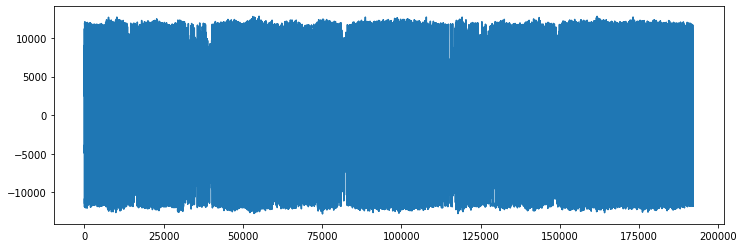

In [20]:
import matplotlib.pyplot as plt

# Original audio with 2 channels 
plt.figure(figsize=(12, 4))
plt.plot(scipy_audio)

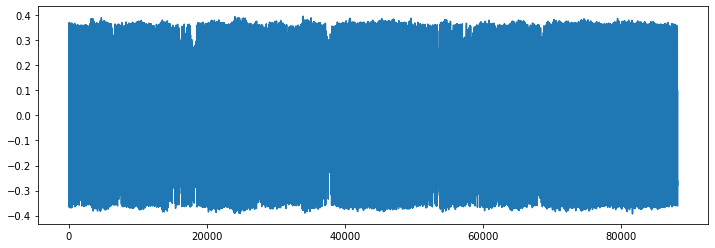

In [21]:
# Librosa audio with channels merged 
plt.figure(figsize=(12, 4))
plt.plot(librosa_audio)

Librosa's mfcc() function which generates an MFCC from time series audio data.

In [22]:
mfccs = librosa.feature.mfcc(y=librosa_audio, sr=librosa_sample_rate, n_mfcc=40)
print(mfccs.shape)

(40, 173)


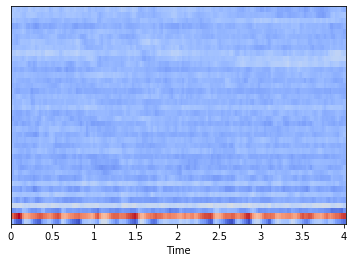

In [23]:
import librosa.display
librosa.display.specshow(mfccs, sr=librosa_sample_rate, x_axis='time')

#### Extracting MFCC's for every file 

We will now extract an MFCC for each audio file in the dataset and store it in a Panda Dataframe along with it's classification label. 

In [24]:
def extract_features(file_name):
   
    try:
        audio, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 
        mfccs = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
        mfccsscaled = np.mean(mfccs.T,axis=0)
        
    except Exception as e:
        print("Error encountered while parsing file: ", file)
        return None 
     
    return mfccsscaled

In [25]:
# Load various imports 
import os

# Set the path to the full dataset 
fulldatasetpath = 'C:/Users/faiza/Desktop/audio/dataset/Train/'

metadata = pd.read_csv('../dataset/labels/train.csv')

features = []

# Iterate through each sound file and extract the features 
for index, row in metadata.iterrows():
    
    file_name = os.path.join(os.path.abspath(fulldatasetpath),str(row["ID"]))
    
    class_label = row["Class"]
    data = extract_features(file_name)
    
    features.append([data, class_label])

# Convert into a Panda dataframe 
featuresdf = pd.DataFrame(features, columns=['feature','class_label'])

print('Finished feature extraction from ', len(featuresdf), ' files') 

Finished feature extraction from  5435  files


### Convert the data and labels

We will use `sklearn.preprocessing.LabelEncoder` to encode the categorical text data into model-understandable numerical data. 

In [26]:
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical

# Convert features and corresponding classification labels into numpy arrays
X = np.array(featuresdf.feature.tolist())
y = np.array(featuresdf.class_label.tolist())

# Encode the classification labels
le = LabelEncoder()
yy = to_categorical(le.fit_transform(y)) 

Using TensorFlow backend.


In [27]:
# split the dataset 
from sklearn.model_selection import train_test_split 

x_train, x_test, y_train, y_test = train_test_split(X, yy, test_size=0.2, random_state = 42)

In [28]:
### store the preprocessed data for use in the next notebook

%store x_train 
%store x_test 
%store y_train 
%store y_test 
%store yy 
%store le

Stored 'x_train' (ndarray)
Stored 'x_test' (ndarray)
Stored 'y_train' (ndarray)
Stored 'y_test' (ndarray)
Stored 'yy' (ndarray)
Stored 'le' (LabelEncoder)


In [29]:
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Convolution2D, MaxPooling2D
from keras.optimizers import Adam
from keras.utils import np_utils
from sklearn import metrics 

num_labels = yy.shape[1]
filter_size = 2

# Construct model 
model = Sequential()

model.add(Dense(256, input_shape=(40,)))
model.add(Activation('relu'))
model.add(Dropout(0.5))

model.add(Dense(256))
model.add(Activation('relu'))
model.add(Dropout(0.5))

model.add(Dense(num_labels))
model.add(Activation('softmax'))

In [30]:
# Compile the model
model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer='adam') 

In [31]:
# Display model architecture summary 
model.summary()

# Calculate pre-training accuracy 
score = model.evaluate(x_test, y_test, verbose=0)
accuracy = 100*score[1]

print("Pre-training accuracy: %.4f%%" % accuracy)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 256)               10496     
_________________________________________________________________
activation_1 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 256)               65792     
_________________________________________________________________
activation_2 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 10)               

In [32]:
from keras.callbacks import ModelCheckpoint 
from datetime import datetime 

num_epochs = 100
num_batch_size = 32

checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.basic_mlp.hdf5', 
                               verbose=1, save_best_only=True)
start = datetime.now()

model.fit(x_train, y_train, batch_size=num_batch_size, epochs=num_epochs, validation_data=(x_test, y_test), callbacks=[checkpointer], verbose=1)


duration = datetime.now() - start
print("Training completed in time: ", duration)

Train on 4348 samples, validate on 1087 samples
Epoch 1/100
4348/4348 [==============================] - 1s 323us/step - loss: 13.5561 - accuracy: 0.1654 - val_loss: 2.2105 - val_accuracy: 0.1601

Epoch 00001: val_loss improved from inf to 2.21048, saving model to saved_models/weights.best.basic_mlp.hdf5
Epoch 2/100
4348/4348 [==============================] - 0s 79us/step - loss: 2.6300 - accuracy: 0.1863 - val_loss: 2.2154 - val_accuracy: 0.2162

Epoch 00002: val_loss did not improve from 2.21048
Epoch 3/100
4348/4348 [==============================] - 0s 80us/step - loss: 2.2612 - accuracy: 0.2118 - val_loss: 2.1522 - val_accuracy: 0.2337

Epoch 00003: val_loss improved from 2.21048 to 2.15219, saving model to saved_models/weights.best.basic_mlp.hdf5
Epoch 4/100
4348/4348 [==============================] - 0s 78us/step - loss: 2.1796 - accuracy: 0.2247 - val_loss: 2.0953 - val_accuracy: 0.2493

Epoch 00004: val_loss improved from 2.15219 to 2.09528, saving model to saved_models/weig

Epoch 33/100
4348/4348 [==============================] - 0s 102us/step - loss: 0.8037 - accuracy: 0.7252 - val_loss: 0.6322 - val_accuracy: 0.7994

Epoch 00033: val_loss improved from 0.63601 to 0.63221, saving model to saved_models/weights.best.basic_mlp.hdf5
Epoch 34/100
4348/4348 [==============================] - 0s 99us/step - loss: 0.8050 - accuracy: 0.7291 - val_loss: 0.6195 - val_accuracy: 0.8040

Epoch 00034: val_loss improved from 0.63221 to 0.61951, saving model to saved_models/weights.best.basic_mlp.hdf5
Epoch 35/100
4348/4348 [==============================] - 0s 92us/step - loss: 0.7810 - accuracy: 0.7410 - val_loss: 0.6322 - val_accuracy: 0.8050

Epoch 00035: val_loss did not improve from 0.61951
Epoch 36/100
4348/4348 [==============================] - 0s 87us/step - loss: 0.7402 - accuracy: 0.7445 - val_loss: 0.6009 - val_accuracy: 0.8096

Epoch 00036: val_loss improved from 0.61951 to 0.60092, saving model to saved_models/weights.best.basic_mlp.hdf5
Epoch 37/100
4348

Epoch 68/100
4348/4348 [==============================] - 0s 77us/step - loss: 0.5117 - accuracy: 0.8259 - val_loss: 0.4109 - val_accuracy: 0.8629

Epoch 00068: val_loss did not improve from 0.39331
Epoch 69/100
4348/4348 [==============================] - 0s 78us/step - loss: 0.4812 - accuracy: 0.8323 - val_loss: 0.4084 - val_accuracy: 0.8721

Epoch 00069: val_loss did not improve from 0.39331
Epoch 70/100
4348/4348 [==============================] - 0s 79us/step - loss: 0.5021 - accuracy: 0.8275 - val_loss: 0.3919 - val_accuracy: 0.8730

Epoch 00070: val_loss improved from 0.39331 to 0.39186, saving model to saved_models/weights.best.basic_mlp.hdf5
Epoch 71/100
4348/4348 [==============================] - 0s 79us/step - loss: 0.5201 - accuracy: 0.8268 - val_loss: 0.4041 - val_accuracy: 0.8721

Epoch 00071: val_loss did not improve from 0.39186
Epoch 72/100
4348/4348 [==============================] - 0s 79us/step - loss: 0.5053 - accuracy: 0.8273 - val_loss: 0.3862 - val_accuracy: 0.

In [33]:
# Evaluating the model on the training and testing set
score = model.evaluate(x_train, y_train, verbose=0)
print("Training Accuracy: ", score[1])

score = model.evaluate(x_test, y_test, verbose=0)
print("Testing Accuracy: ", score[1])

Training Accuracy:  0.9517019391059875
Testing Accuracy:  0.896044135093689


In [34]:

def extract_feature(file_name):
   
    try:
        audio_data, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 
        mfccs = librosa.feature.mfcc(y=audio_data, sr=sample_rate, n_mfcc=40)
        mfccsscaled = np.mean(mfccs.T,axis=0)
        
    except Exception as e:
        print("Error encountered while parsing file: ", file)
        return None, None

    return np.array([mfccsscaled])

In [35]:
def print_prediction(file_name):
    prediction_feature = extract_feature(file_name) 

    predicted_vector = model.predict_classes(prediction_feature)
    predicted_class = le.inverse_transform(predicted_vector) 
    print("The predicted class is:", predicted_class[0], '\n') 

    predicted_proba_vector = model.predict_proba(prediction_feature) 
    predicted_proba = predicted_proba_vector[0]
    for i in range(len(predicted_proba)): 
        category = le.inverse_transform(np.array([i]))
        print(category[0], "\t\t : ", format(predicted_proba[i], '.32f') )

In [36]:
# Class: Street Music

filename = '../dataset/Train/1.wav' 
print_prediction(filename) 

The predicted class is: street_music 

air_conditioner 		 :  0.00000006287751830313936807215214
car_horn 		 :  0.00000148359185914159752428531647
children_playing 		 :  0.00000004457876201513499836437404
dog_bark 		 :  0.00000167786060956132132560014725
drilling 		 :  0.00065587618155404925346374511719
engine_idling 		 :  0.00000093503314246845548041164875
gun_shot 		 :  0.00001242177131643984466791152954
jackhammer 		 :  0.00014168389316182583570480346680
siren 		 :  0.00000001841938335189752251608297
street_music 		 :  0.99918574094772338867187500000000


## Here we use Test data to test our model

In [ ]:
filename = '../dataset/Test/5.wav'
print_prediction(filename) 

### Here we use CNN to improve accuracy

In [44]:
max_pad_len = 174

def extract_features(file_name):
   
    try:
        audio, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 
        mfccs = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
        pad_width = max_pad_len - mfccs.shape[1]
        mfccs = np.pad(mfccs, pad_width=((0, 0), (0, pad_width)), mode='constant')
        
    except Exception as e:
        print("Error encountered while parsing file: ", file_name)
        return None 
     
    return mfccs

In [46]:
fulldatasetpath = 'C:/Users/faiza/Desktop/audio/dataset/Train/'

metadata = pd.read_csv('../dataset/labels/train.csv')

features = []

# Iterate through each sound file and extract the features 
for index, row in metadata.iterrows():
    
    file_name = os.path.join(os.path.abspath(fulldatasetpath)),str(row["ID"])
    
    class_label = row["Class"]
    data = extract_features(file_name)
    
    features.append([data, class_label])

# Convert into a Panda dataframe 
featuresdf = pd.DataFrame(features, columns=['feature','class_label'])

print('Finished feature extraction from ', len(featuresdf), ' files') 

Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '0.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '1.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '2.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '3.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '4.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '6.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '10.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '11.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '12.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Trai

Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '1269.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '1270.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '1271.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '1272.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '1273.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '1275.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '1276.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '1277.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '1278.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Deskt

Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '2225.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '2226.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '2227.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '2228.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '2229.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '2230.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '2233.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '2235.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '2236.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Deskt

Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '3042.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '3046.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '3050.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '3051.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '3052.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '3054.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '3055.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '3056.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '3060.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Deskt

Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '3932.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '3933.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '3934.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '3936.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '3938.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '3939.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '3940.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '3941.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '3943.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Deskt

Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '5118.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '5119.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '5121.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '5122.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '5125.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '5127.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '5128.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '5129.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '5130.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Deskt

Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '6189.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '6191.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '6193.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '6194.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '6196.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '6197.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '6198.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '6204.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '6205.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Deskt

Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '7260.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '7262.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '7263.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '7264.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '7265.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '7269.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '7272.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '7274.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '7275.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Deskt

Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '8384.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '8386.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '8387.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '8391.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '8392.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '8393.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '8395.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '8396.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Desktop\\audio\\dataset\\Train', '8397.wav')
Error encountered while parsing file:  ('C:\\Users\\faiza\\Deskt

In [47]:
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical

# Convert features and corresponding classification labels into numpy arrays
X = np.array(featuresdf.feature.tolist())
y = np.array(featuresdf.class_label.tolist())

# Encode the classification labels
le = LabelEncoder()
yy = to_categorical(le.fit_transform(y)) 

# split the dataset 
from sklearn.model_selection import train_test_split 

x_train, x_test, y_train, y_test = train_test_split(X, yy, test_size=0.2, random_state = 42)

# CNN Arcitechture

In [48]:
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Convolution2D, Conv2D, MaxPooling2D, GlobalAveragePooling2D
from keras.optimizers import Adam
from keras.utils import np_utils
from sklearn import metrics 

num_rows = 40
num_columns = 174
num_channels = 1

x_train = x_train.reshape(x_train.shape[0], num_rows, num_columns, num_channels)
x_test = x_test.reshape(x_test.shape[0], num_rows, num_columns, num_channels)

num_labels = yy.shape[1]
filter_size = 2

# Construct model 
model = Sequential()
model.add(Conv2D(filters=16, kernel_size=2, input_shape=(num_rows, num_columns, num_channels), activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.2))

model.add(Conv2D(filters=32, kernel_size=2, activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.2))

model.add(Conv2D(filters=64, kernel_size=2, activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.2))

model.add(Conv2D(filters=128, kernel_size=2, activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.2))
model.add(GlobalAveragePooling2D())

model.add(Dense(num_labels, activation='softmax')) 

ValueError: cannot reshape array of size 4348 into shape (4348,40,174,1)

In [43]:
# Compile the model
model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer='adam') 

NameError: name 'model' is not defined

In [44]:
# Display model architecture summary 
model.summary()

# Calculate pre-training accuracy 
score = model.evaluate(x_test, y_test, verbose=1)
accuracy = 100*score[1]

print("Pre-training accuracy: %.4f%%" % accuracy)

NameError: name 'model' is not defined

In [45]:
from keras.callbacks import ModelCheckpoint 
from datetime import datetime 

#num_epochs = 12
#num_batch_size = 128

num_epochs = 72
num_batch_size = 256

checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.basic_cnn.hdf5', 
                               verbose=1, save_best_only=True)
start = datetime.now()

model.fit(x_train, y_train, batch_size=num_batch_size, epochs=num_epochs, validation_data=(x_test, y_test), callbacks=[checkpointer], verbose=1)


duration = datetime.now() - start
print("Training completed in time: ", duration)

NameError: name 'model' is not defined

In [46]:
# Evaluating the model on the training and testing set
score = model.evaluate(x_train, y_train, verbose=0)
print("Training Accuracy: ", score[1])

score = model.evaluate(x_test, y_test, verbose=0)
print("Testing Accuracy: ", score[1])

NameError: name 'model' is not defined

In [47]:
def print_prediction(file_name):
    prediction_feature = extract_features(file_name) 
    prediction_feature = prediction_feature.reshape(1, num_rows, num_columns, num_channels)

    predicted_vector = model.predict_classes(prediction_feature)
    predicted_class = le.inverse_transform(predicted_vector) 
    print("The predicted class is:", predicted_class[0], '\n') 

    predicted_proba_vector = model.predict_proba(prediction_feature) 
    predicted_proba = predicted_proba_vector[0]
    for i in range(len(predicted_proba)): 
        category = le.inverse_transform(np.array([i]))
        print(category[0], "\t\t : ", format(predicted_proba[i], '.32f') )

In [48]:
# Class: Street Music

filename = '../dataset/Train/1.wav' 
print_prediction(filename) 

NameError: name 'model' is not defined

In [49]:
filename = '../dataset/Test/5.wav'
print_prediction(filename) 

NameError: name 'model' is not defined